### Part 2: Clustering
Apply Spark ML custering algorithm to cluster the spatial data, then visualize the clustering results. 

In [0]:
from csv import reader
from pyspark.sql import Row 
from pyspark.sql import SparkSession
from pyspark.sql.types import *
import pandas as pd
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
import os
import statsmodels.api as sm
os.environ["PYSPARK_PYTHON"] = "python3"

#### Data preparation

In [0]:
data_path = "dbfs:/projects/LA_crime/data/LA_crimedata.csv"

In [0]:
spark = SparkSession \
    .builder \
    .appName("crime analysis") \
    .config("spark.some.config.option", "some-value") \
    .getOrCreate()

df = spark.read.format("csv").option("header", "true").load(data_path)
from pyspark.sql.functions import *
# add new columns to convert Date to date format
# DataFrame.withColumn(): Returns a new DataFrame by adding a column or replacing the existing column that has the same name.
df_update = df.withColumn("Date Rptd", to_date(col("Date Rptd"), "MM/dd/yyyy hh:mm:ss a"))
df_update = df_update.withColumn('DATE OCC', to_date(df_update['DATE OCC'], 'MM/dd/yyyy hh:mm:ss a'))

df_update = df_update.withColumn('TIME OCC', to_timestamp(df_update['TIME OCC'], 'HHmm'))
df_update = df_update.withColumn('hour_OCC', hour(col('TIME OCC')))
df_update = df_update.withColumn('minute_OCC', minute(col('TIME OCC')))
df_update = df_update.withColumn('second_OCC', second(col('TIME OCC')))

In [0]:
display(df_update)

DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Mocodes,Vict Age,Vict Sex,Vict Descent,Premis Cd,Premis Desc,Weapon Used Cd,Weapon Desc,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON,hour_OCC,minute_OCC,second_OCC
001307355,2010-02-20,2010-02-20,1970-01-01T13:50:00.000+0000,13,Newton,1385,2,900,VIOLATION OF COURT ORDER,0913 1814 2000,48,M,H,501,SINGLE FAMILY DWELLING,null,null,AA,Adult Arrest,900,null,null,null,300 E GAGE AV,null,33.9825,-118.2695,13,50,0
011401303,2010-09-13,2010-09-12,1970-01-01T00:45:00.000+0000,14,Pacific,1485,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)",0329,0,M,W,101,STREET,null,null,IC,Invest Cont,740,null,null,null,SEPULVEDA BL,MANCHESTER AV,33.9599,-118.3962,0,45,0
070309629,2010-08-09,2010-08-09,1970-01-01T15:15:00.000+0000,13,Newton,1324,2,946,OTHER MISCELLANEOUS CRIME,0344,0,M,H,103,ALLEY,null,null,IC,Invest Cont,946,null,null,null,1300 E 21ST ST,null,34.0224,-118.2524,15,15,0
090631215,2010-01-05,2010-01-05,1970-01-01T01:50:00.000+0000,06,Hollywood,0646,2,900,VIOLATION OF COURT ORDER,1100 0400 1402,47,F,W,101,STREET,102,HAND GUN,IC,Invest Cont,900,998,null,null,CAHUENGA BL,HOLLYWOOD BL,34.1016,-118.3295,1,50,0
100100501,2010-01-03,2010-01-02,1970-01-01T21:00:00.000+0000,01,Central,0176,1,122,"RAPE, ATTEMPTED",0400,47,F,H,103,ALLEY,400,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",IC,Invest Cont,122,null,null,null,8TH ST,SAN PEDRO ST,34.0387,-118.2488,21,0,0
100100506,2010-01-05,2010-01-04,1970-01-01T16:50:00.000+0000,01,Central,0162,1,442,SHOPLIFTING - PETTY THEFT ($950 & UNDER),0344 1402,23,M,B,404,DEPARTMENT STORE,null,null,AA,Adult Arrest,442,null,null,null,700 W 7TH ST,null,34.048,-118.2577,16,50,0
100100508,2010-01-08,2010-01-07,1970-01-01T20:05:00.000+0000,01,Central,0182,1,330,BURGLARY FROM VEHICLE,0344,46,M,H,101,STREET,null,null,IC,Invest Cont,330,null,null,null,PICO BL,GRAND AV,34.0389,-118.2643,20,5,0
100100509,2010-01-09,2010-01-08,1970-01-01T21:00:00.000+0000,01,Central,0157,1,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",0416,51,M,B,710,OTHER PREMISE,500,UNKNOWN WEAPON/OTHER WEAPON,AA,Adult Arrest,230,null,null,null,500 CROCKER ST,null,34.0435,-118.2427,21,0,0
100100510,2010-01-09,2010-01-09,1970-01-01T02:30:00.000+0000,01,Central,0171,1,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",0400 0416,30,M,H,108,PARKING LOT,400,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",IC,Invest Cont,230,null,null,null,800 W OLYMPIC BL,null,34.045,-118.264,2,30,0
100100511,2010-01-09,2010-01-06,1970-01-01T21:00:00.000+0000,01,Central,0132,1,341,"THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LIVESTK,PROD",0344 1402,55,M,W,710,OTHER PREMISE,null,null,IC,Invest Cont,341,998,null,null,200 S OLIVE ST,null,34.0538,-118.2488,21,0,0


In [0]:
crime_cluster_df = df_update.select(["DATE OCC", "AREA NAME", "Crm Cd Desc", "Status Desc", "LAT", "LON"])
display(crime_cluster_df)

DATE OCC,AREA NAME,Crm Cd Desc,Status Desc,LAT,LON
2010-02-20,Newton,VIOLATION OF COURT ORDER,Adult Arrest,33.9825,-118.2695
2010-09-12,Pacific,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)",Invest Cont,33.9599,-118.3962
2010-08-09,Newton,OTHER MISCELLANEOUS CRIME,Invest Cont,34.0224,-118.2524
2010-01-05,Hollywood,VIOLATION OF COURT ORDER,Invest Cont,34.1016,-118.3295
2010-01-02,Central,"RAPE, ATTEMPTED",Invest Cont,34.0387,-118.2488
2010-01-04,Central,SHOPLIFTING - PETTY THEFT ($950 & UNDER),Adult Arrest,34.048,-118.2577
2010-01-07,Central,BURGLARY FROM VEHICLE,Invest Cont,34.0389,-118.2643
2010-01-08,Central,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",Adult Arrest,34.0435,-118.2427
2010-01-09,Central,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",Invest Cont,34.045,-118.264
2010-01-06,Central,"THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LIVESTK,PROD",Invest Cont,34.0538,-118.2488


In [0]:
from pyspark.ml.feature import VectorAssembler
# VectorAssembler requires numeric data type
crime_cluster_df = crime_cluster_df.withColumn("LAT", crime_cluster_df["LAT"].cast(DoubleType()))
crime_cluster_df = crime_cluster_df.withColumn("LON", crime_cluster_df["LON"].cast(DoubleType()))
vecAssembler = VectorAssembler(inputCols=["LAT", "LON"], outputCol="features")
crime_cluster_df = vecAssembler.transform(crime_cluster_df)

In [0]:
crime_cluster_df.printSchema()

root
 |-- DATE OCC: date (nullable = true)
 |-- AREA NAME: string (nullable = true)
 |-- Crm Cd Desc: string (nullable = true)
 |-- Status Desc: string (nullable = true)
 |-- LAT: double (nullable = true)
 |-- LON: double (nullable = true)
 |-- features: vector (nullable = true)



In [0]:
display(crime_cluster_df)

DATE OCC,AREA NAME,Crm Cd Desc,Status Desc,LAT,LON,features
2010-02-20,Newton,VIOLATION OF COURT ORDER,Adult Arrest,33.9825,-118.2695,"Map(vectorType -> dense, length -> 2, values -> List(33.9825, -118.2695))"
2010-09-12,Pacific,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)",Invest Cont,33.9599,-118.3962,"Map(vectorType -> dense, length -> 2, values -> List(33.9599, -118.3962))"
2010-08-09,Newton,OTHER MISCELLANEOUS CRIME,Invest Cont,34.0224,-118.2524,"Map(vectorType -> dense, length -> 2, values -> List(34.0224, -118.2524))"
2010-01-05,Hollywood,VIOLATION OF COURT ORDER,Invest Cont,34.1016,-118.3295,"Map(vectorType -> dense, length -> 2, values -> List(34.1016, -118.3295))"
2010-01-02,Central,"RAPE, ATTEMPTED",Invest Cont,34.0387,-118.2488,"Map(vectorType -> dense, length -> 2, values -> List(34.0387, -118.2488))"
2010-01-04,Central,SHOPLIFTING - PETTY THEFT ($950 & UNDER),Adult Arrest,34.048,-118.2577,"Map(vectorType -> dense, length -> 2, values -> List(34.048, -118.2577))"
2010-01-07,Central,BURGLARY FROM VEHICLE,Invest Cont,34.0389,-118.2643,"Map(vectorType -> dense, length -> 2, values -> List(34.0389, -118.2643))"
2010-01-08,Central,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",Adult Arrest,34.0435,-118.2427,"Map(vectorType -> dense, length -> 2, values -> List(34.0435, -118.2427))"
2010-01-09,Central,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",Invest Cont,34.045,-118.264,"Map(vectorType -> dense, length -> 2, values -> List(34.045, -118.264))"
2010-01-06,Central,"THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LIVESTK,PROD",Invest Cont,34.0538,-118.2488,"Map(vectorType -> dense, length -> 2, values -> List(34.0538, -118.2488))"


In [0]:
crime_cluster_df.columns

Out[9]: ['DATE OCC',
 'AREA NAME',
 'Crm Cd Desc',
 'Status Desc',
 'LAT',
 'LON',
 'features']

#### Data cleaning

In [0]:
from pyspark.ml.clustering import KMeans
kmeans = KMeans(k=5, seed=1)  
model = kmeans.fit(crime_cluster_df.select('features'))
transformed = model.transform(crime_cluster_df)
transformed.show() 

+----------+---------+--------------------+------------+-------+---------+-------------------+----------+
|  DATE OCC|AREA NAME|         Crm Cd Desc| Status Desc|    LAT|      LON|           features|prediction|
+----------+---------+--------------------+------------+-------+---------+-------------------+----------+
|2010-02-20|   Newton|VIOLATION OF COUR...|Adult Arrest|33.9825|-118.2695|[33.9825,-118.2695]|         0|
|2010-09-12|  Pacific|VANDALISM - FELON...| Invest Cont|33.9599|-118.3962|[33.9599,-118.3962]|         3|
|2010-08-09|   Newton|OTHER MISCELLANEO...| Invest Cont|34.0224|-118.2524|[34.0224,-118.2524]|         0|
|2010-01-05|Hollywood|VIOLATION OF COUR...| Invest Cont|34.1016|-118.3295|[34.1016,-118.3295]|         3|
|2010-01-02|  Central|     RAPE, ATTEMPTED| Invest Cont|34.0387|-118.2488|[34.0387,-118.2488]|         0|
|2010-01-04|  Central|SHOPLIFTING - PET...|Adult Arrest| 34.048|-118.2577| [34.048,-118.2577]|         0|
|2010-01-07|  Central|BURGLARY FROM VEH...| In

In [0]:
# Shows the result.
centers = model.clusterCenters()
print("Cluster Centers: ")
for center in centers:
    print(center)

Cluster Centers: 
[  33.98808034 -118.26402026]
[0. 0.]
[  34.2069761  -118.56183057]
[  34.05080449 -118.3563731 ]
[  34.21341526 -118.42226687]


There are outliers in the dataset

In [0]:
crime_cluster_df.count()

Out[12]: 2135664

In [0]:
bounds = {
    c: dict(
        zip(["q1", "q3"], crime_cluster_df.approxQuantile(c, [0.25, 0.75], 0))
    )
    for c in crime_cluster_df.select(["LAT","LON"]).columns
}
print(bounds)

for c in bounds:
    iqr = bounds[c]['q3'] - bounds[c]['q1']
    bounds[c]['lower'] = bounds[c]['q1'] - (iqr * 1.5)
    bounds[c]['upper'] = bounds[c]['q3'] + (iqr * 1.5)
print(bounds)

from pyspark.sql.functions import *
crime_cluster_df = crime_cluster_df.select(["LAT","LON"]).where(col("LAT").between(bounds['LAT']['lower'], bounds['LAT']['upper'])).where(col("LON").between(bounds['LON']['lower'], bounds['LON']['upper']))
print(crime_cluster_df.count())

{'LAT': {'q1': 34.0099, 'q3': 34.1758}, 'LON': {'q1': -118.4366, 'q3': -118.2777}}
{'LAT': {'q1': 34.0099, 'q3': 34.1758, 'lower': 33.76105, 'upper': 34.42465}, 'LON': {'q1': -118.4366, 'q3': -118.2777, 'lower': -118.67495, 'upper': -118.03934999999998}}
2093263


In [0]:
crime_cluster_df = crime_cluster_df.withColumn("LAT", crime_cluster_df["LAT"].cast(DoubleType()))
crime_cluster_df = crime_cluster_df.withColumn("LON", crime_cluster_df["LON"].cast(DoubleType()))
vecAssembler = VectorAssembler(inputCols=["LAT", "LON"], outputCol="features")
crime_cluster_df = vecAssembler.transform(crime_cluster_df)

#### Model building

In [0]:
from pyspark.ml.clustering import KMeans
from pyspark.ml.evaluation import ClusteringEvaluator

kmeans = KMeans(k=5, seed=1)  
model = kmeans.fit(crime_cluster_df.select('features'))
transformed = model.transform(crime_cluster_df)
evaluator = ClusteringEvaluator()
silhouette = evaluator.evaluate(transformed)
print("Silhouette with squared euclidean distance = " + str(silhouette))
centers = model.clusterCenters()
print("Cluster Centers: ")
for center in centers:
    print(center)

Silhouette with squared euclidean distance = 0.6034705212042714
Cluster Centers: 
[  34.03053258 -118.27113707]
[  34.20987384 -118.56195186]
[  34.03690901 -118.39152072]
[  33.81344887 -118.28135887]
[  34.21263033 -118.42150439]


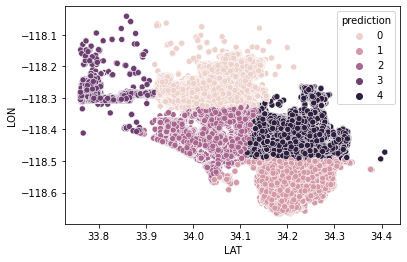

In [0]:
transformed_pd = transformed.toPandas()
sb.scatterplot(data=transformed_pd, x="LAT", y="LON", hue="prediction")
plt.show()

#### Model optimization

In [0]:
#Optimize choice of k
cost = np.zeros(20)
for k in range(2,20):
    kmeans = KMeans().setK(k).setSeed(1).setFeaturesCol("features")
    model = kmeans.fit(crime_cluster_df.select('features').sample(False,0.1, seed=42))
    # Make predictions
    predictions = model.transform(crime_cluster_df.select('features'))
    # Evaluate clustering by computing Silhouette score
    evaluator = ClusteringEvaluator()
    cost[k] = evaluator.evaluate(predictions)


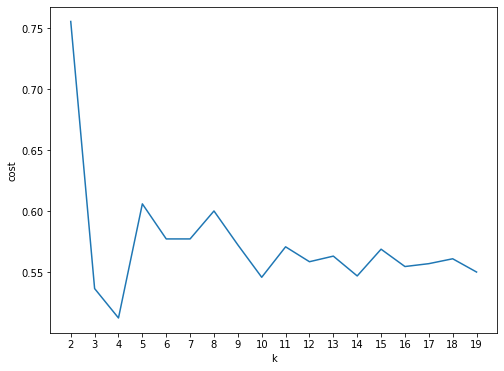

In [0]:
fig, ax = plt.subplots(1,1, figsize =(8,6))
ax.plot(range(2,20),cost[2:20])
ax.set_xticks(range(2,20,1))
ax.set_xlabel('k')
ax.set_ylabel('cost')
display()

In [0]:
# retrain the model using parameter k = 4
kmeans = KMeans(k=4, seed=1)  
model = kmeans.fit(crime_cluster_df.select('features'))
transformed = model.transform(crime_cluster_df)
evaluator = ClusteringEvaluator()
silhouette = evaluator.evaluate(transformed)
print("Silhouette with squared euclidean distance = " + str(silhouette))
centers = model.clusterCenters()
print("Cluster Centers: ")
for center in centers:
    print(center)

Silhouette with squared euclidean distance = 0.5489062368893554
Cluster Centers: 
[  34.20940063 -118.4776911 ]
[  34.06816056 -118.27099915]
[  33.80715449 -118.28095963]
[  33.99698334 -118.33897792]


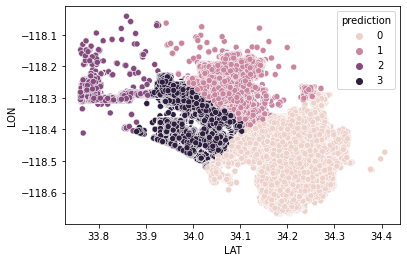

In [0]:
transformed_pd = transformed.toPandas()
sb.scatterplot(data=transformed_pd, x="LAT", y="LON", hue="prediction")
plt.show()